<a href="https://www.kaggle.com/code/utkarshx27/fashion-ecommerce-user-data-analysis?scriptVersionId=129540428" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/fashion-ecommerce-user-data/6M-0K-99K.users.dataset.public.csv
/kaggle/input/fashion-ecommerce-user-data/Buyers-repartition-by-country.csv


# Install Packages

In [2]:
!pip install autoviz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.9/67.9 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 50.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 53.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.5/96.5 kB 8.5 MB/s eta 0:00:00


In [3]:
import seaborn as sns
import matplotlib.pyplot as plt
from autoviz.classify_method import data_cleaning_suggestions
%matplotlib inline
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Imported v0.1.603. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


# Data Loading and Preprocessing (df1)

In [4]:
df1 = pd.read_csv('/kaggle/input/fashion-ecommerce-user-data/6M-0K-99K.users.dataset.public.csv')
df2 = pd.read_csv('/kaggle/input/fashion-ecommerce-user-data/Buyers-repartition-by-country.csv')

In [5]:
data_cleaning_suggestions(df1)

Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nullpercent,NuniquePercent,dtype,Nuniques,Nulls,Least num. of categories,Data cleaning improvement suggestions
identifierHash,0.000000,100.000000,int64,98913,0,0,possible ID column: drop
type,0.000000,0.001011,object,1,0,98913,invariant values: drop
seniorityAsYears,0.000000,0.006066,float64,6,0,0,
seniorityAsMonths,0.000000,0.019209,float64,19,0,0,
seniority,0.000000,0.019209,int64,19,0,0,
daysSinceLastLogin,0.000000,0.707693,int64,700,0,0,
hasProfilePicture,0.000000,0.002022,bool,2,0,0,
hasIosApp,0.000000,0.002022,bool,2,0,0,
hasAndroidApp,0.000000,0.002022,bool,2,0,0,
hasAnyApp,0.000000,0.002022,bool,2,0,0,


In [6]:
data_cleaning_suggestions(df2)

Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nullpercent,NuniquePercent,dtype,Nuniques,Nulls,Least num. of categories,Data cleaning improvement suggestions
topboughtperwishlistratio,48.387097,51.612903,float64,32,30,0,"fill missing values, right skewed distribution: cap or drop outliers"
topmeanfollowing,46.774194,37.096774,float64,23,29,0,"fill missing values, right skewed distribution: cap or drop outliers"
topmeanproductsliked,46.774194,53.225806,float64,33,29,0,"fill missing values, right skewed distribution: cap or drop outliers"
topmeanproductsbought,46.774194,48.387097,float64,30,29,0,"fill missing values, right skewed distribution: cap or drop outliers"
topboughtperlikeratio,46.774194,53.225806,float64,33,29,0,"fill missing values, right skewed distribution: cap or drop outliers"
topmeanproductswished,46.774194,51.612903,float64,32,29,0,"fill missing values, right skewed distribution: cap or drop outliers"
topfemalebuyersratio,46.774194,22.580645,float64,14,29,0,"fill missing values, left skewed distribution: cap or drop outliers"
topmeanofflinedays,46.774194,45.161290,float64,28,29,0,"fill missing values, right skewed distribution: cap or drop outliers"
topmeanfollowers,46.774194,41.935484,float64,26,29,0,"fill missing values, right skewed distribution: cap or drop outliers"
boughtperwishlistratio,8.064516,85.483871,float64,53,5,0,"fill missing values, right skewed distribution: cap or drop outliers"


In [7]:
df1.drop(columns=['identifierHash', 'type'], inplace=True)
country_counts = df1['country'].value_counts()
threshold = 10
infrequent_countries = country_counts[country_counts < threshold].index
df1.loc[df1['country'].isin(infrequent_countries), 'country'] = 'Other'
countryCode_counts = df1['countryCode'].value_counts()
infrequent_countryCodes = countryCode_counts[countryCode_counts < threshold].index
df1.loc[df1['countryCode'].isin(infrequent_countryCodes), 'countryCode'] = 'Other'

In [8]:
df1.head()

,country,language,socialNbFollowers,socialNbFollows,socialProductsLiked,productsListed,productsSold,productsPassRate,productsWished,productsBought,...,civilityTitle,hasAnyApp,hasAndroidApp,hasIosApp,hasProfilePicture,daysSinceLastLogin,seniority,seniorityAsMonths,seniorityAsYears,countryCode
0,Etats-Unis,en,3,8,0,0,0,0.0,0,0,...,mrs,False,False,False,True,709,3205,106.83,8.9,us
1,Allemagne,de,3,8,0,0,0,0.0,0,0,...,mrs,False,False,False,True,709,3205,106.83,8.9,de
2,Suède,en,3,8,0,0,0,0.0,0,0,...,mr,True,False,True,True,689,3205,106.83,8.9,se
3,Turquie,en,3,8,0,0,0,0.0,0,0,...,mrs,False,False,False,True,709,3205,106.83,8.9,tr
4,France,en,3,8,0,0,0,0.0,0,0,...,mr,True,False,True,True,709,3205,106.83,8.9,fr


In [9]:
df1.describe()

,socialNbFollowers,socialNbFollows,socialProductsLiked,productsListed,productsSold,productsPassRate,productsWished,productsBought,civilityGenderId,daysSinceLastLogin,seniority,seniorityAsMonths,seniorityAsYears
count,98913.000000,98913.000000,98913.000000,98913.000000,98913.000000,98913.000000,98913.000000,98913.000000,98913.000000,98913.000000,98913.000000,98913.000000,98913.000000
mean,3.432269,8.425677,4.420743,0.093304,0.121592,0.812303,1.562595,0.171929,1.773993,655.732310,3063.771870,102.125583,8.510424
std,3.882383,52.839572,181.030569,2.050144,2.126895,8.500205,25.192793,2.332266,0.428679,7407.430369,168.298621,5.609735,0.467863
min,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,11.000000,2852.000000,95.070000,7.920000
25%,3.000000,8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,572.000000,2857.000000,95.230000,7.940000
50%,3.000000,8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,694.000000,3196.000000,106.530000,8.880000
75%,3.000000,8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,702.000000,3201.000000,106.700000,8.890000
max,744.000000,13764.000000,51671.000000,244.000000,174.000000,100.000000,2635.000000,405.000000,3.000000,737028.000000,3205.000000,106.830000,8.900000


# EDA (df1)

## Distribution of numerical variables 

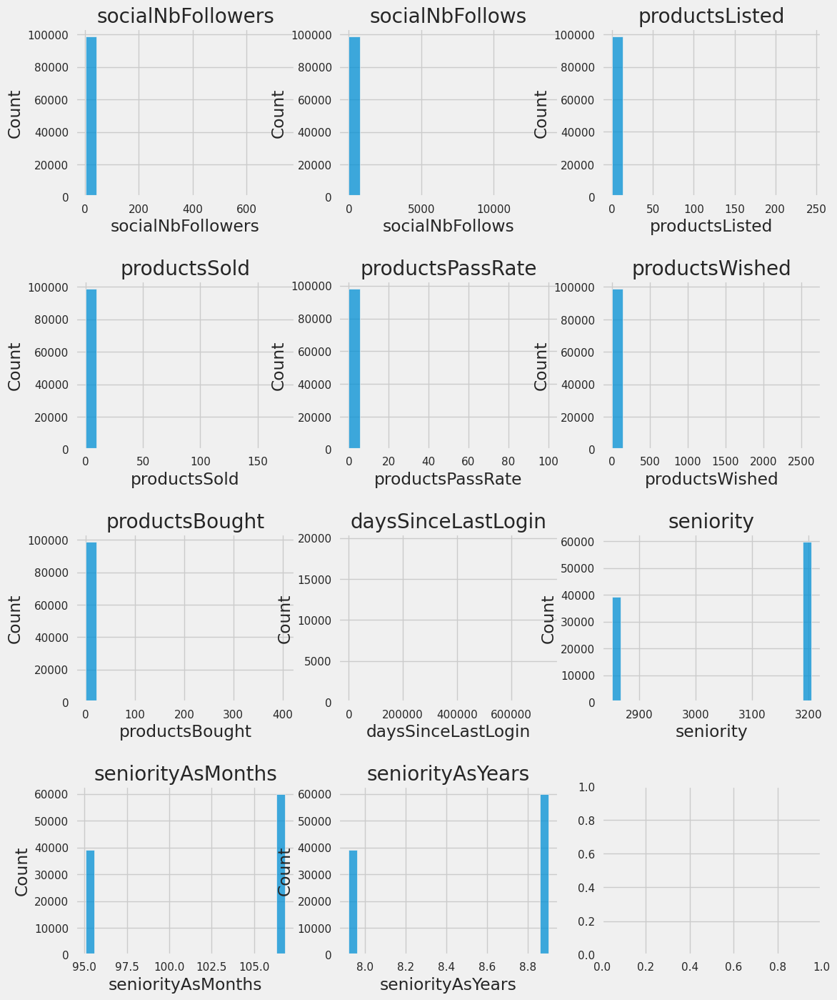

In [10]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(12, 16))
fig.subplots_adjust(hspace=0.5)

sns.histplot(df1['socialNbFollowers'], ax=axes[0, 0])
sns.histplot(df1['socialNbFollows'], ax=axes[0, 1])
sns.histplot(df1['productsListed'], ax=axes[0, 2])
sns.histplot(df1['productsSold'], ax=axes[1, 0])
sns.histplot(df1['productsPassRate'], ax=axes[1, 1])
sns.histplot(df1['productsWished'], ax=axes[1, 2])
sns.histplot(df1['productsBought'], ax=axes[2, 0])
sns.histplot(df1['daysSinceLastLogin'], ax=axes[2, 1])
sns.histplot(df1['seniority'], ax=axes[2, 2])
sns.histplot(df1['seniorityAsMonths'], ax=axes[3, 0])
sns.histplot(df1['seniorityAsYears'], ax=axes[3, 1])
axes[0, 0].set_title('socialNbFollowers')
axes[0, 1].set_title('socialNbFollows')
axes[0, 2].set_title('productsListed')
axes[1, 0].set_title('productsSold')
axes[1, 1].set_title('productsPassRate')
axes[1, 2].set_title('productsWished')
axes[2, 0].set_title('productsBought')
axes[2, 1].set_title('daysSinceLastLogin')
axes[2, 2].set_title('seniority')
axes[3, 0].set_title('seniorityAsMonths')
axes[3, 1].set_title('seniorityAsYears')
plt.show()

## Relationship analysis

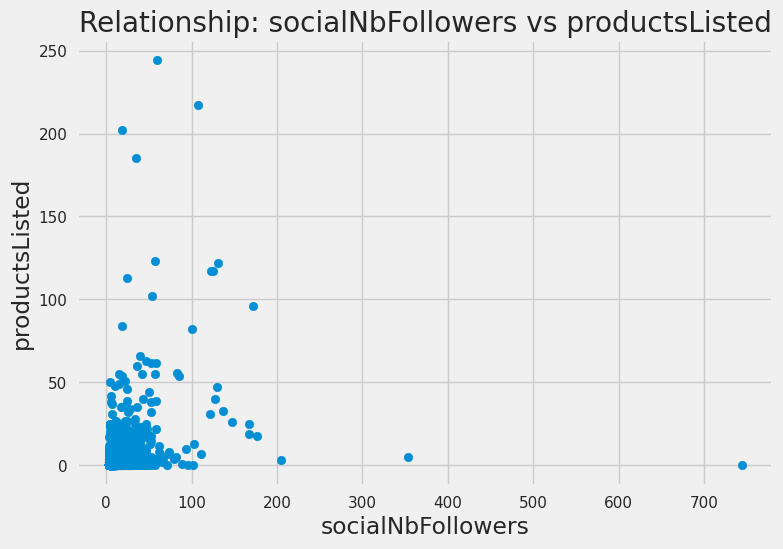

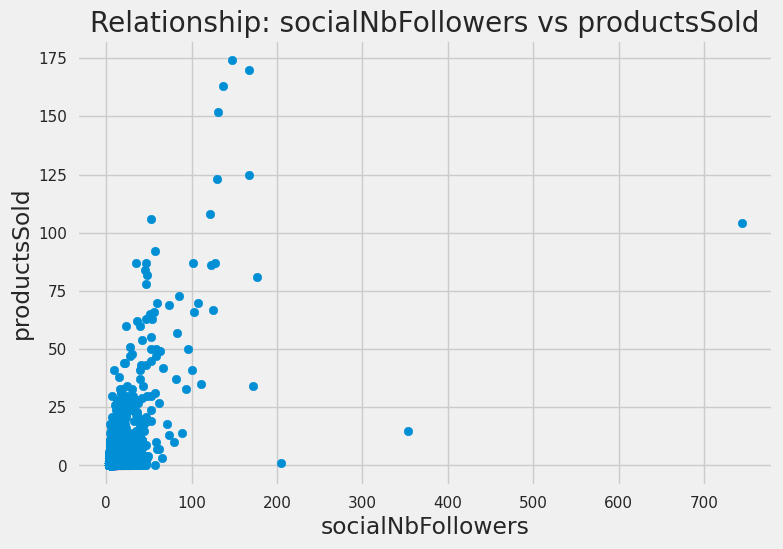

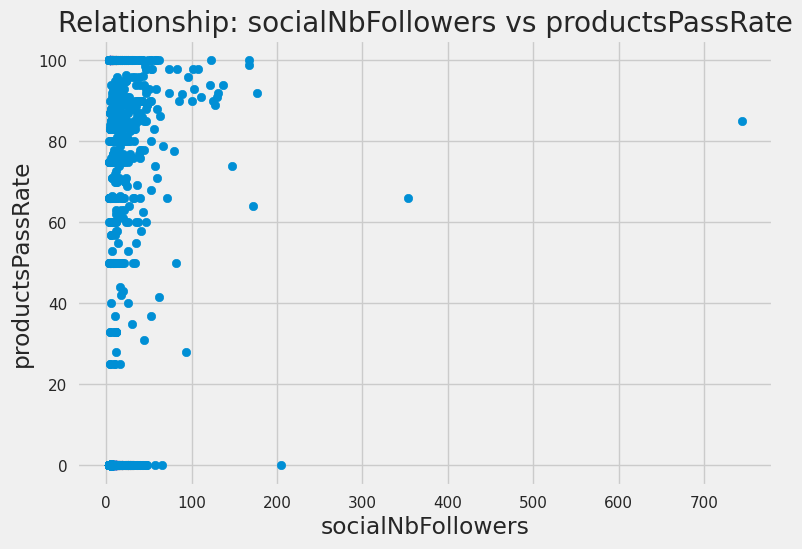

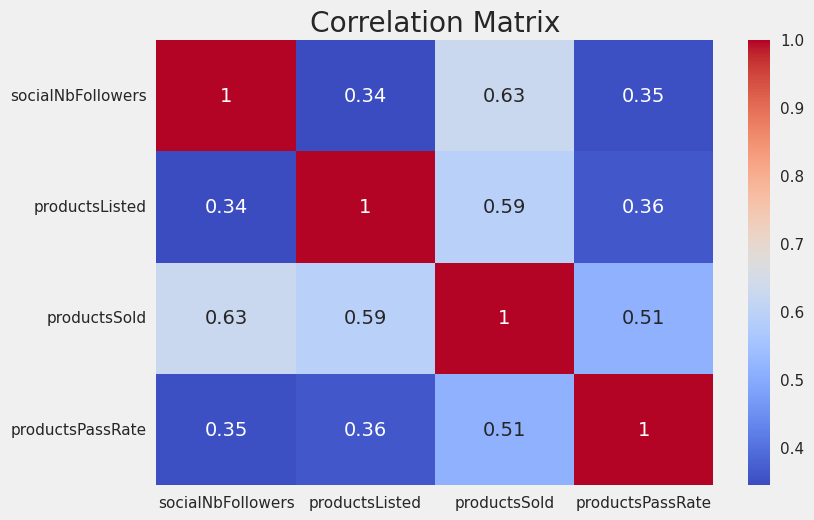

In [11]:
plt.scatter(df1['socialNbFollowers'], df1['productsListed'])
plt.xlabel('socialNbFollowers')
plt.ylabel('productsListed')
plt.title('Relationship: socialNbFollowers vs productsListed')
plt.show()
plt.scatter(df1['socialNbFollowers'], df1['productsSold'])
plt.xlabel('socialNbFollowers')
plt.ylabel('productsSold')
plt.title('Relationship: socialNbFollowers vs productsSold')
plt.show()
plt.scatter(df1['socialNbFollowers'], df1['productsPassRate'])
plt.xlabel('socialNbFollowers')
plt.ylabel('productsPassRate')
plt.title('Relationship: socialNbFollowers vs productsPassRate')
plt.show()
corr_matrix = df1[['socialNbFollowers', 'productsListed', 'productsSold', 'productsPassRate']].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

## Categorical variables

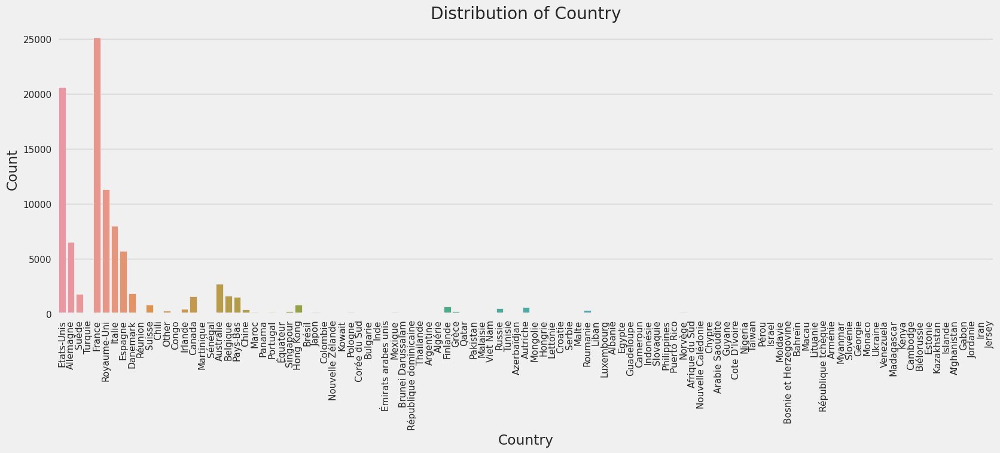

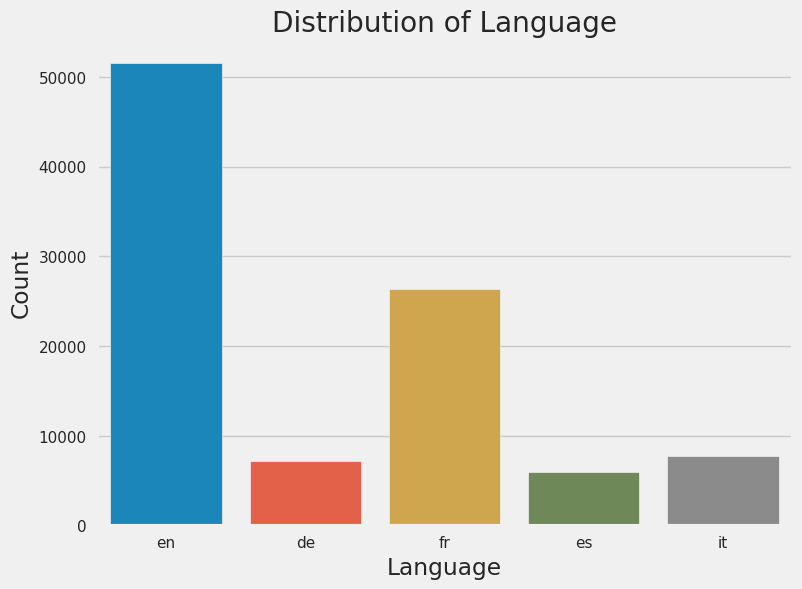

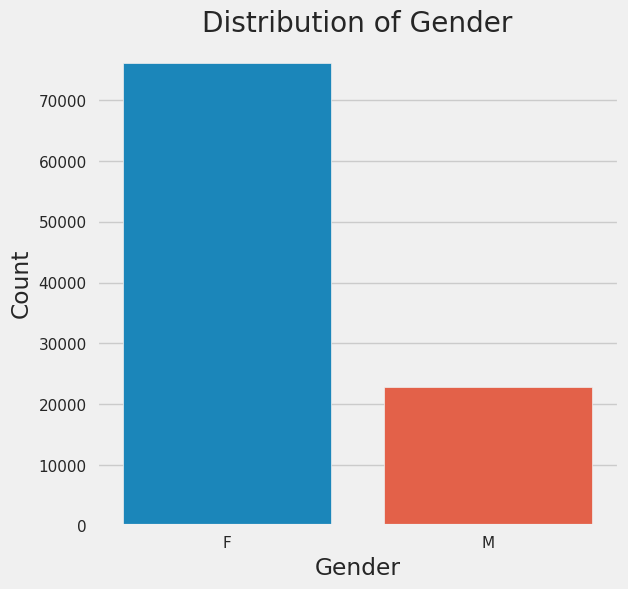

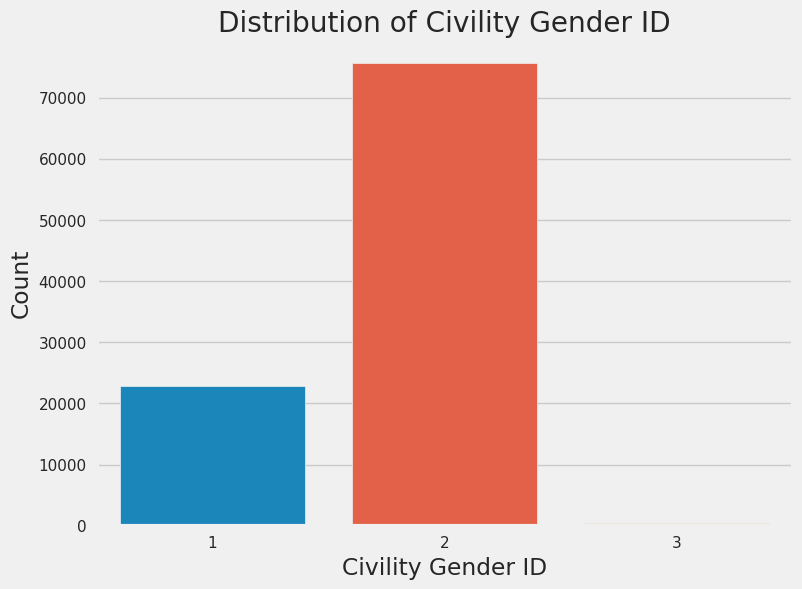

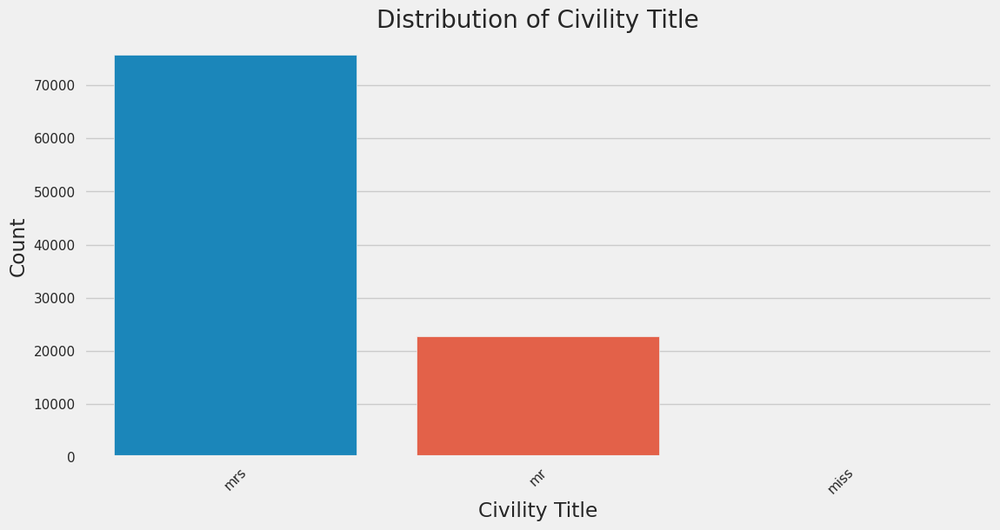

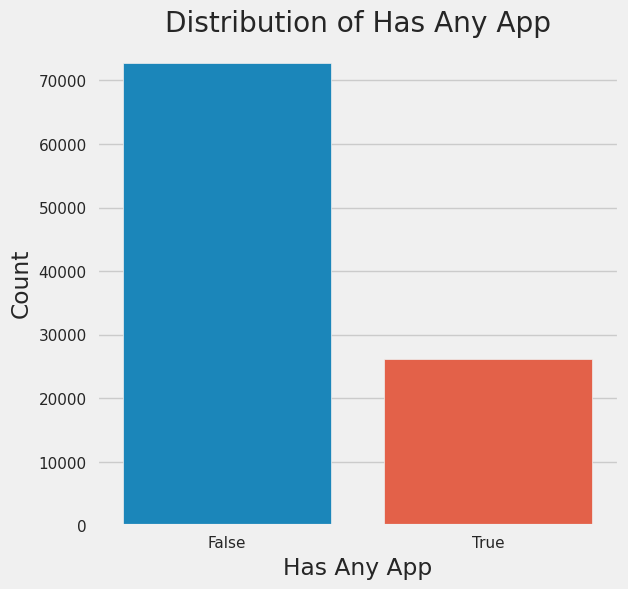

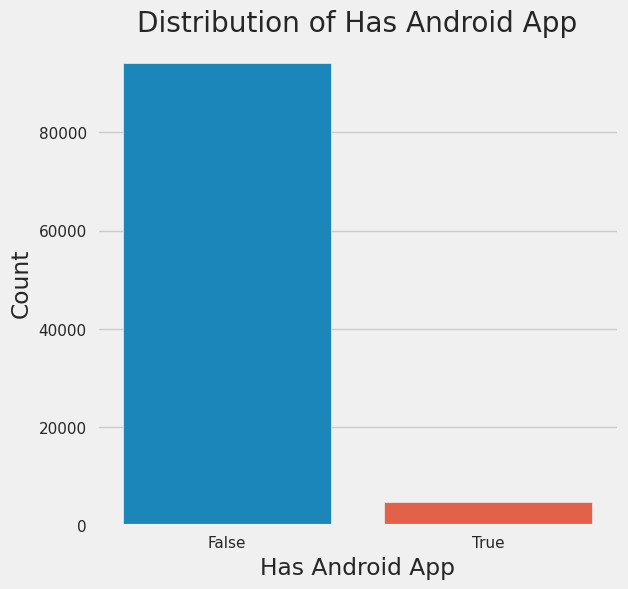

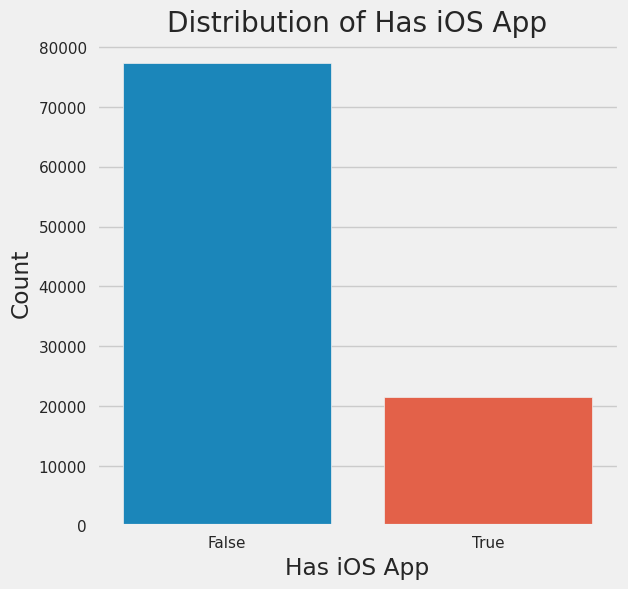

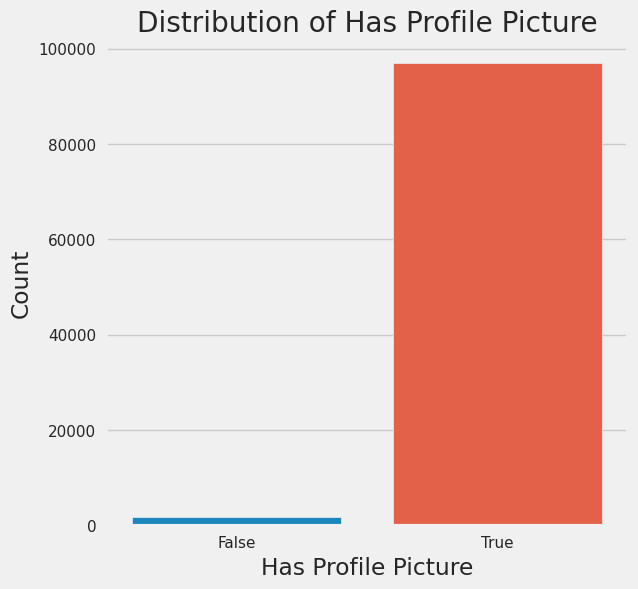

In [12]:
plt.figure(figsize=(18, 6))
sns.countplot(data=df1, x='country')
plt.xlabel('Country')
plt.ylabel('Count')
plt.title('Distribution of Country')
plt.xticks(rotation=90)
plt.show()
plt.figure(figsize=(8, 6))
sns.countplot(data=df1, x='language')
plt.xlabel('Language')
plt.ylabel('Count')
plt.title('Distribution of Language')
plt.show()



plt.figure(figsize=(6, 6))
sns.countplot(data=df1, x='gender')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.title('Distribution of Gender')
plt.show()

plt.figure(figsize=(8, 6))
sns.countplot(data=df1, x='civilityGenderId')
plt.xlabel('Civility Gender ID')
plt.ylabel('Count')
plt.title('Distribution of Civility Gender ID')
plt.show()

plt.figure(figsize=(12, 6))
sns.countplot(data=df1, x='civilityTitle')
plt.xlabel('Civility Title')
plt.ylabel('Count')
plt.title('Distribution of Civility Title')
plt.xticks(rotation=45)
plt.show()

plt.figure(figsize=(6, 6))
sns.countplot(data=df1, x='hasAnyApp')
plt.xlabel('Has Any App')
plt.ylabel('Count')
plt.title('Distribution of Has Any App')
plt.show()
plt.figure(figsize=(6, 6))
sns.countplot(data=df1, x='hasAndroidApp')
plt.xlabel('Has Android App')
plt.ylabel('Count')
plt.title('Distribution of Has Android App')
plt.show()
plt.figure(figsize=(6, 6))
sns.countplot(data=df1, x='hasIosApp')
plt.xlabel('Has iOS App')
plt.ylabel('Count')
plt.title('Distribution of Has iOS App')
plt.show()
plt.figure(figsize=(6, 6))
sns.countplot(data=df1, x='hasProfilePicture')
plt.xlabel('Has Profile Picture')
plt.ylabel('Count')
plt.title('Distribution of Has Profile Picture')
plt.show()

## Grouping and aggregation

In [13]:
grouped_by_country = df1.groupby('country').agg({'socialNbFollowers': ['mean', 'median', 'count'],
                                                 'productsListed': ['mean', 'median', 'count'],
                                                 'productsSold': ['mean', 'median', 'count'],
                                                 'productsPassRate': ['mean', 'median', 'count']})

grouped_by_language = df1.groupby('language').agg({'socialNbFollowers': ['mean', 'median', 'count'],
                                                   'productsListed': ['mean', 'median', 'count'],
                                                   'productsSold': ['mean', 'median', 'count'],
                                                   'productsPassRate': ['mean', 'median', 'count']})


print("Grouped Data by Country:")
print(grouped_by_country)
print("\nGrouped Data by Language:")
print(grouped_by_language)

Grouped Data by Country:
                    socialNbFollowers              productsListed         \
                                 mean median count           mean median   
country                                                                    
Afghanistan                  3.200000    3.0    10       0.000000    0.0   
Afrique du Sud               3.024096    3.0    83       0.000000    0.0   
Albanie                      3.081081    3.0    37       0.000000    0.0   
Algérie                      3.092105    3.0    76       0.000000    0.0   
Allemagne                    3.447693    3.0  6567       0.053145    0.0   
...                               ...    ...   ...            ...    ...   
Ukraine                      3.745455    3.0   110       0.018182    0.0   
Venezuela                    3.142857    3.0    14       0.000000    0.0   
Viet Nam                     3.312500    3.0    64       0.000000    0.0   
Émirats arabes unis          3.335878    3.0   131       0.0000

## Feature engineering   

In [14]:
# newfeature----> average products sold per day
df1['avgProductsSoldPerDay'] = df1['productsSold'] / df1['daysSinceLastLogin']
# Creating the additional categorical variable--> seniority category
bins = [0, 100, 500, float('inf')]
labels = ['newbie', 'experienced', 'veteran']
df1['seniorityCategory'] = pd.cut(df1['seniority'], bins=bins, labels=labels)
print(df1.head())

      country language  socialNbFollowers  socialNbFollows  \
0  Etats-Unis       en                  3                8   
1   Allemagne       de                  3                8   
2       Suède       en                  3                8   
3     Turquie       en                  3                8   
4      France       en                  3                8   

   socialProductsLiked  productsListed  productsSold  productsPassRate  \
0                    0               0             0               0.0   
1                    0               0             0               0.0   
2                    0               0             0               0.0   
3                    0               0             0               0.0   
4                    0               0             0               0.0   

   productsWished  productsBought  ... hasAndroidApp  hasIosApp  \
0               0               0  ...         False      False   
1               0               0  ...         F

# Auto Visuialization (expect error)

Shape of your Data Set loaded: (98913, 24)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nullpercent,NuniquePercent,dtype,Nuniques,Nulls,Least num. of categories,Data cleaning improvement suggestions
identifierHash,0.000000,100.000000,int64,98913,0,0,possible ID column: drop
type,0.000000,0.001011,object,1,0,98913,invariant values: drop
seniorityAsYears,0.000000,0.006066,float64,6,0,0,
seniorityAsMonths,0.000000,0.019209,float64,19,0,0,
seniority,0.000000,0.019209,int64,19,0,0,
daysSinceLastLogin,0.000000,0.707693,int64,700,0,0,
hasProfilePicture,0.000000,0.002022,bool,2,0,0,
hasIosApp,0.000000,0.002022,bool,2,0,0,
hasAndroidApp,0.000000,0.002022,bool,2,0,0,
hasAnyApp,0.000000,0.002022,bool,2,0,0,


    24 Predictors classified...
        2 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['identifierHash', 'type']
Number of All Scatter Plots = 6


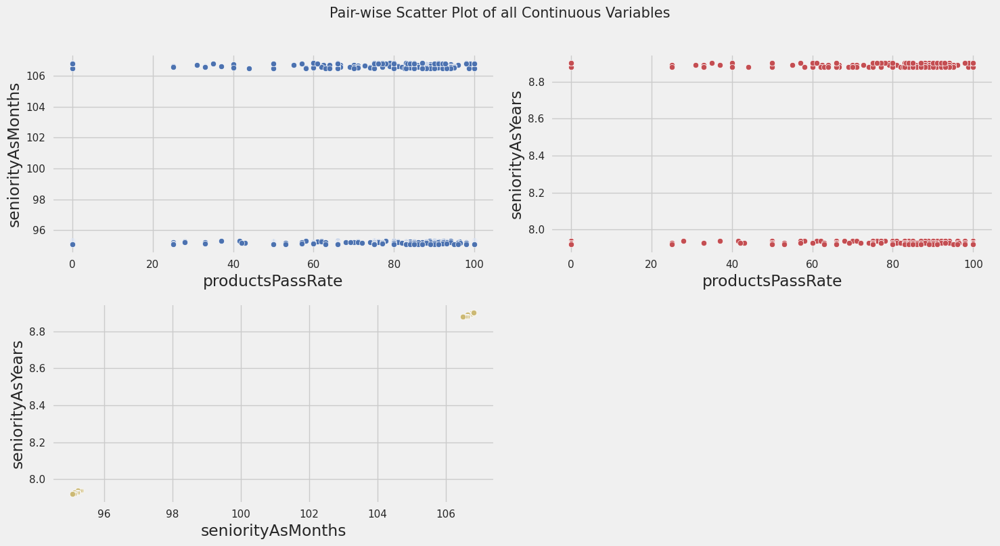

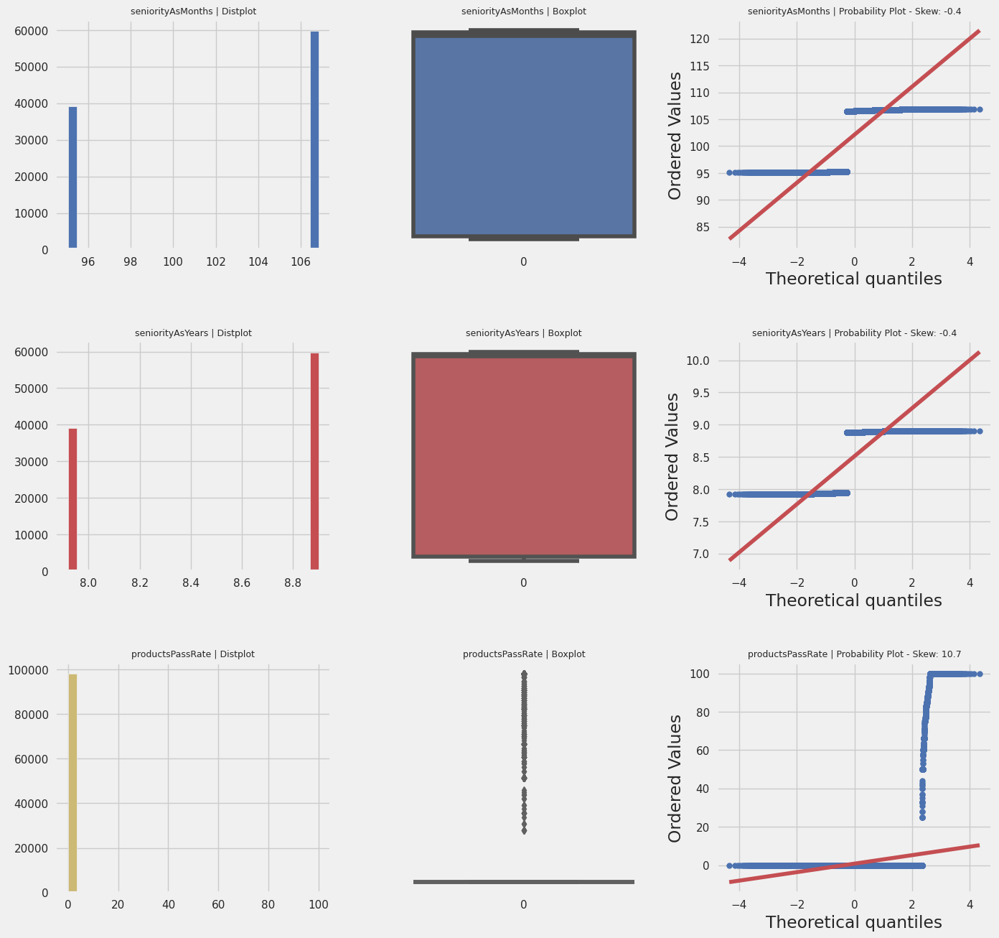

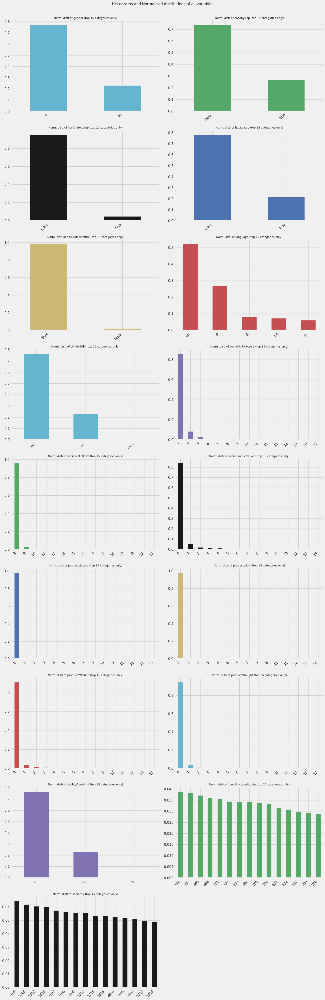

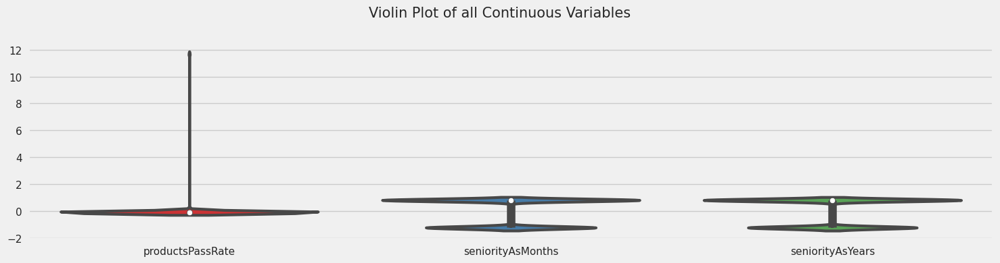

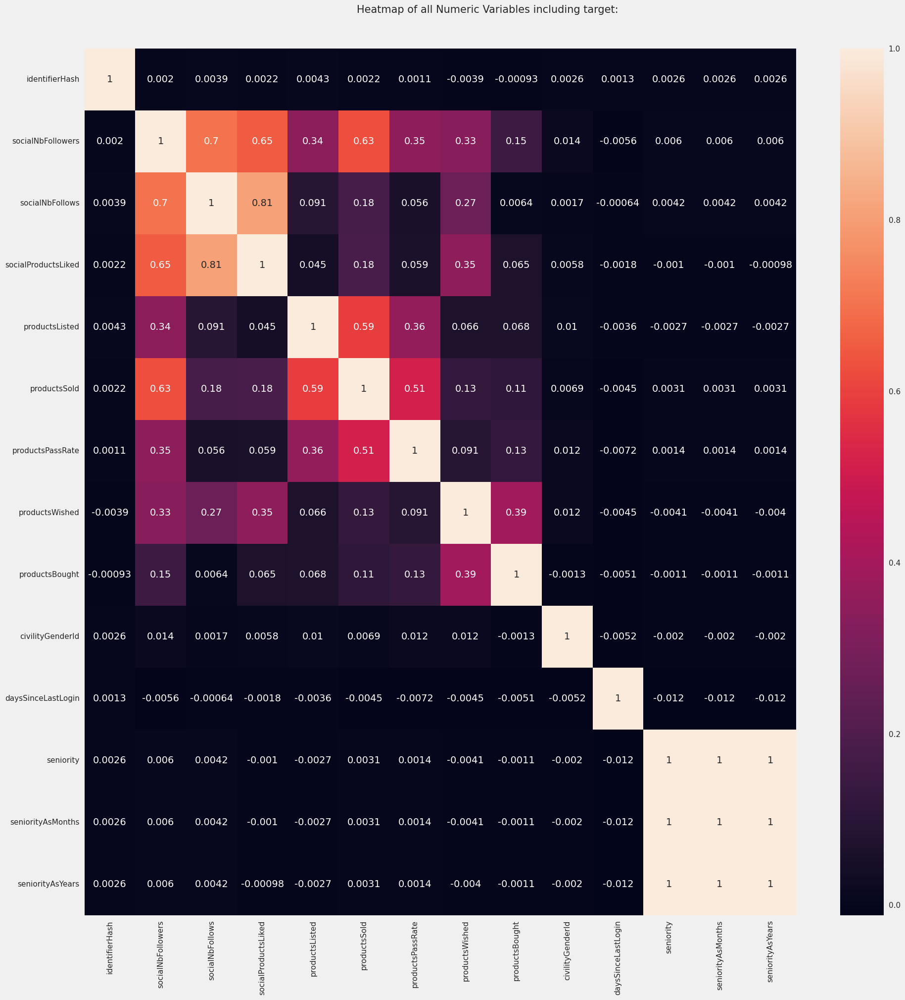

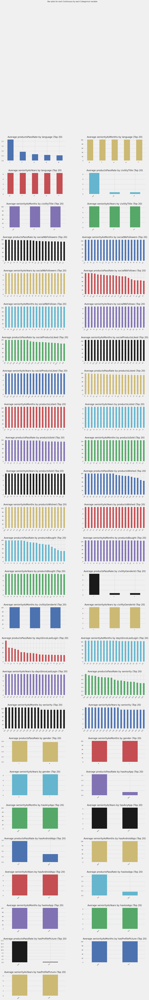

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     /usr/share/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     /usr/share/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     /usr/share/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     /usr/share/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     /usr/share/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /usr/share/nltk_data...
[nltk_data]    |   Package movie_reviews is already up-to-date!
[nltk

,identifierHash,type,country,language,socialNbFollowers,socialNbFollows,socialProductsLiked,productsListed,productsSold,productsPassRate,...,civilityTitle,hasAnyApp,hasAndroidApp,hasIosApp,hasProfilePicture,daysSinceLastLogin,seniority,seniorityAsMonths,seniorityAsYears,countryCode
0,-7279641312655250028,user,Etats-Unis,en,3,8,0,0,0,0.0,...,mrs,False,False,False,True,709,3205,106.83,8.9,us
1,-1456013578740053406,user,Allemagne,de,3,8,0,0,0,0.0,...,mrs,False,False,False,True,709,3205,106.83,8.9,de
2,9006282053848196165,user,Suède,en,3,8,0,0,0,0.0,...,mr,True,False,True,True,689,3205,106.83,8.9,se
3,-7154634866120535654,user,Turquie,en,3,8,0,0,0,0.0,...,mrs,False,False,False,True,709,3205,106.83,8.9,tr
4,2858299215060733023,user,France,en,3,8,0,0,0,0.0,...,mr,True,False,True,True,709,3205,106.83,8.9,fr
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98908,-5324380437900495747,user,Etats-Unis,fr,3,8,0,0,0,0.0,...,mr,False,False,False,True,708,3204,106.80,8.9,us
98909,-5607668753771114442,user,France,fr,3,8,0,0,0,0.0,...,mr,True,False,True,True,695,3204,106.80,8.9,fr
98910,350630276238833248,user,Belgique,en,3,8,0,0,0,0.0,...,mr,True,True,False,True,520,3204,106.80,8.9,be
98911,2006580738726207028,user,Italie,it,3,8,0,0,0,0.0,...,mrs,False,False,False,True,267,3204,106.80,8.9,it


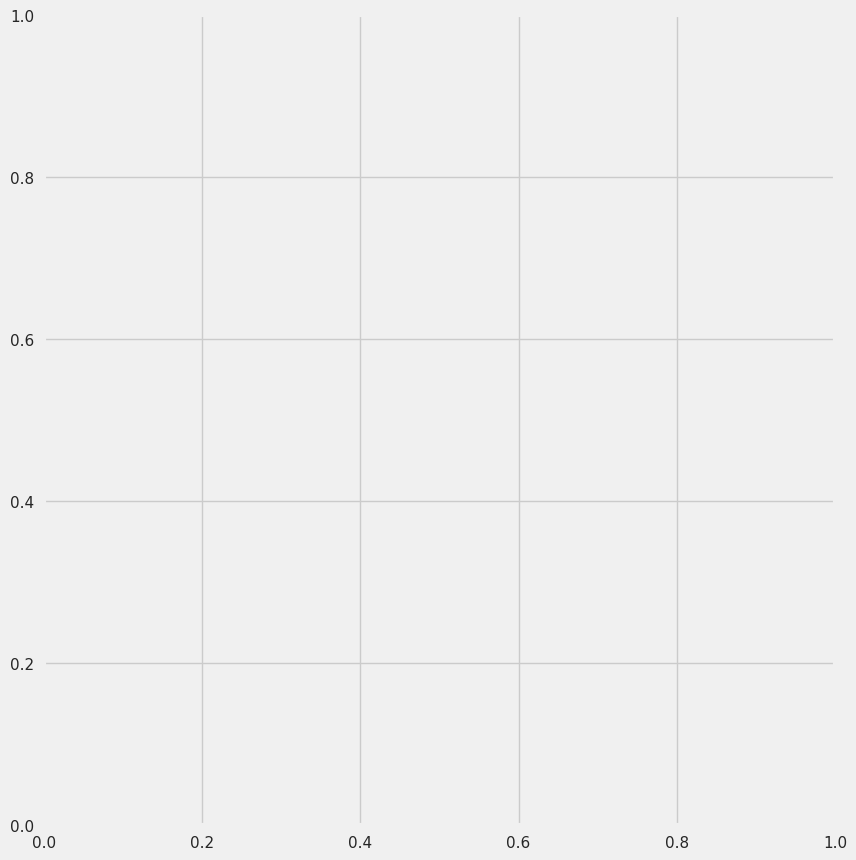

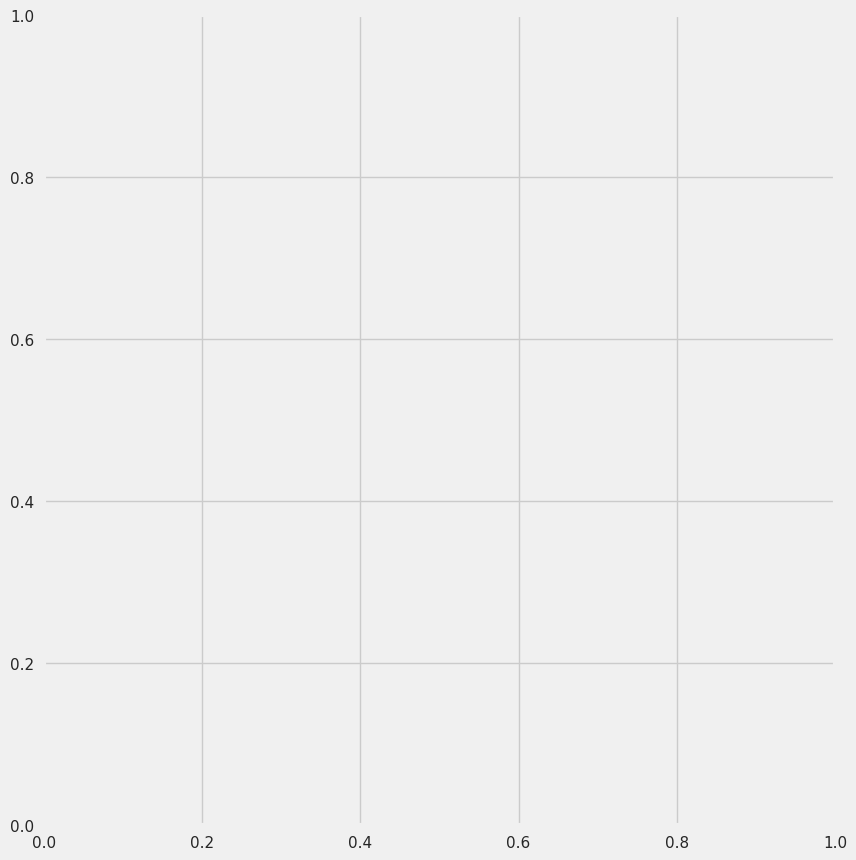

In [15]:
AV.AutoViz('/kaggle/input/fashion-ecommerce-user-data/6M-0K-99K.users.dataset.public.csv')

# Will update notebook - with df2